<a href="https://colab.research.google.com/github/pinilDissanayaka/Rice-Crop-Disease-Detection/blob/main/Notebook0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install livelossplot
!pip install visualkeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 8.3 MB/s eta 0:00:00


In [3]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [5]:
! kaggle datasets download shayanriyaz/riceleafs

Dataset URL: https://www.kaggle.com/datasets/shayanriyaz/riceleafs
License(s): CC0-1.0
riceleafs.zip: Skipping, found more recently modified local copy (use --force to force download)


In [6]:
! unzip /content/riceleafs.zip

Streaming output truncated to the last 5000 lines.
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144631.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144637.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144641.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144645.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144647.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144651.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144654.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144656.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144658.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144730.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144733.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144738.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144742.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144810.jpg  
  inflating: RiceLeafs/train/Hispa/IMG_20190419_144812.jpg  
  inflating: RiceLeafs/train/Hispa

In [72]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cv2 as cv
import os
import random
from glob import glob
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.applications import ResNet101V2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler, ModelCheckpoint, ReduceLROnPlateau
from livelossplot import PlotLossesKerasTF
import visualkeras
from sklearn.metrics import classification_report, confusion_matrix

import warnings
warnings.filterwarnings(action = 'ignore')

In [8]:
mainDir=f"/content/RiceLeafs"

In [11]:
glob(mainDir + '/*')

['/content/RiceLeafs/train', '/content/RiceLeafs/validation']

In [13]:
trainDir=glob(mainDir + '/*')[0]
validationDir=glob(mainDir + '/*')[1]


print(f"Training directory : {trainDir}")
print(f"Validation directory : {validationDir}")

Training directory : /content/RiceLeafs/train
Validation directory : /content/RiceLeafs/validation


In [40]:
trainClasses=glob(trainDir + '/*')
validationClasses=glob(validationDir + '/*')


print(f"Training set has {len(trainClasses) } classes.")
print(f"It class names are { os.listdir(trainDir)}")
print(f"It has { len(glob(trainDir + '/*/*')) } images.")
print("\n")
print(f"Validation set has {len(validationClasses) } classes.")
print(f"It class names are { os.listdir(validationDir)}")
print(f"It has { len(glob(validationDir + '/*/*')) } images.")

Training set has 4 classes.
It class names are ['Hispa', 'Healthy', 'BrownSpot', 'LeafBlast']
It has 2684 images.


Validation set has 4 classes.
It class names are ['Hispa', 'Healthy', 'BrownSpot', 'LeafBlast']
It has 671 images.


In [47]:
for dir in glob(mainDir + '/*'):
  classes=os.listdir(trainDir)
  for _class in classes:
    path=os.path.join(dir, _class)
    imageSize=len(glob(path + '/*'))
    print(f"{path} path has {imageSize} images.")
  print('\n')

/content/RiceLeafs/train/Hispa path has 452 images.
/content/RiceLeafs/train/Healthy path has 1191 images.
/content/RiceLeafs/train/BrownSpot path has 418 images.
/content/RiceLeafs/train/LeafBlast path has 623 images.


/content/RiceLeafs/validation/Hispa path has 113 images.
/content/RiceLeafs/validation/Healthy path has 297 images.
/content/RiceLeafs/validation/BrownSpot path has 105 images.
/content/RiceLeafs/validation/LeafBlast path has 156 images.




In [56]:
def printImages(dir, _class):
  path = random.choices(list(glob(dir + f'/{_class}/*')), k = 9)
  plt.figure(figsize = (16, 16))
  j = 1
  for i in path:
    img = plt.imread(i)
    plt.subplot(3, 3, j)
    plt.imshow(img, cmap='gray')
    plt.title(f"Class : {_class } Shape {img.shape}")
    plt.axis('off')
    j = j +1

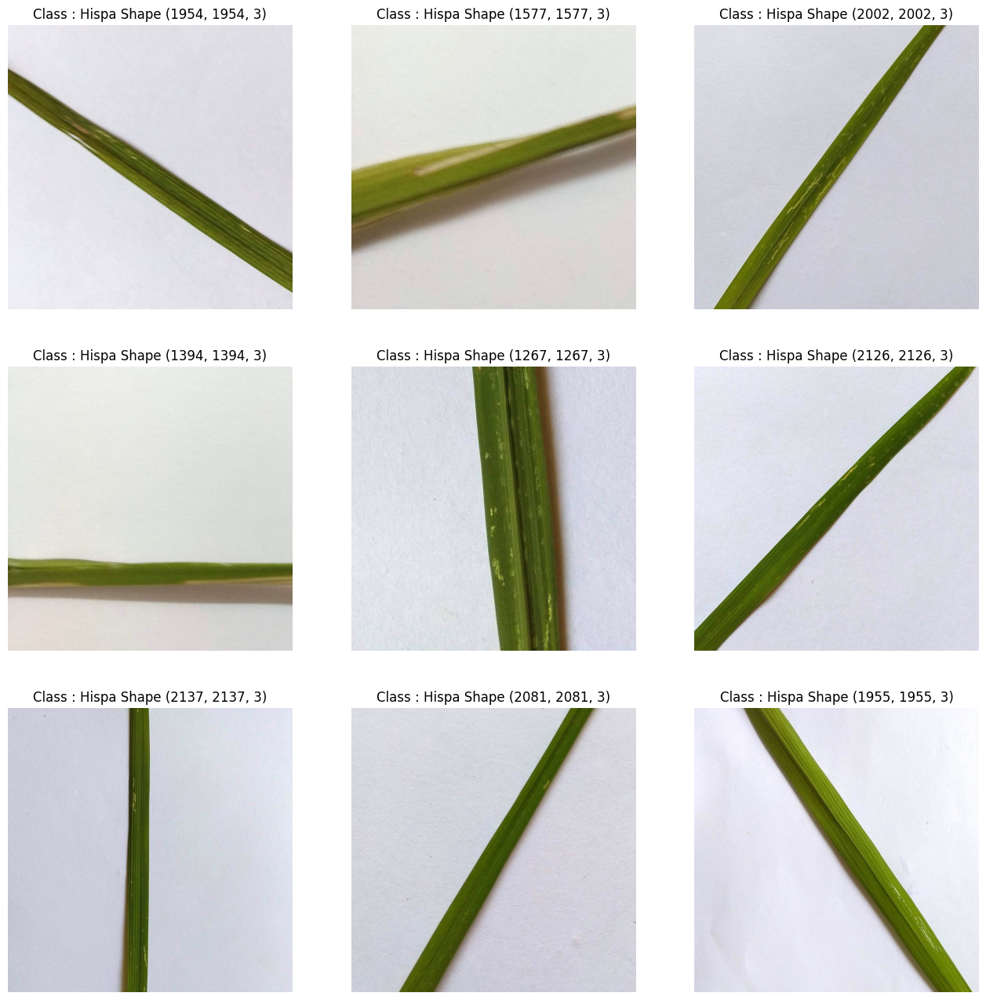

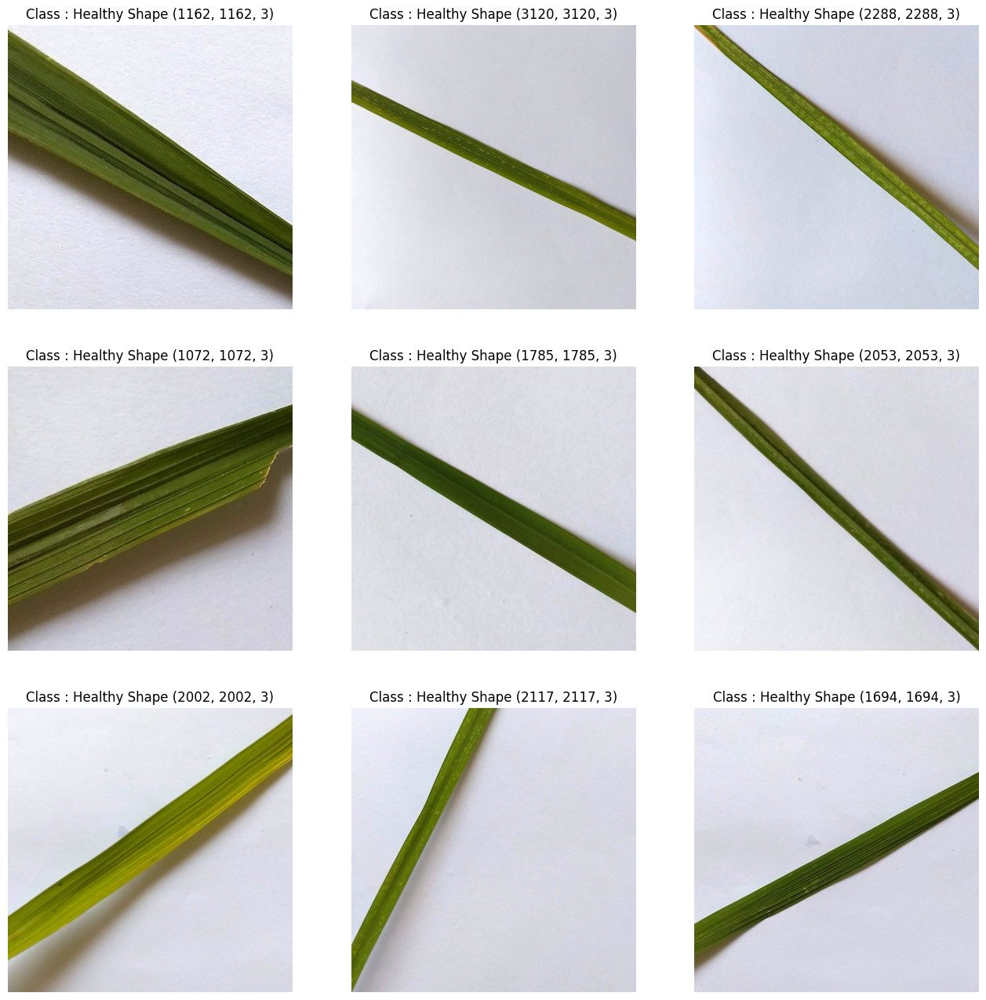

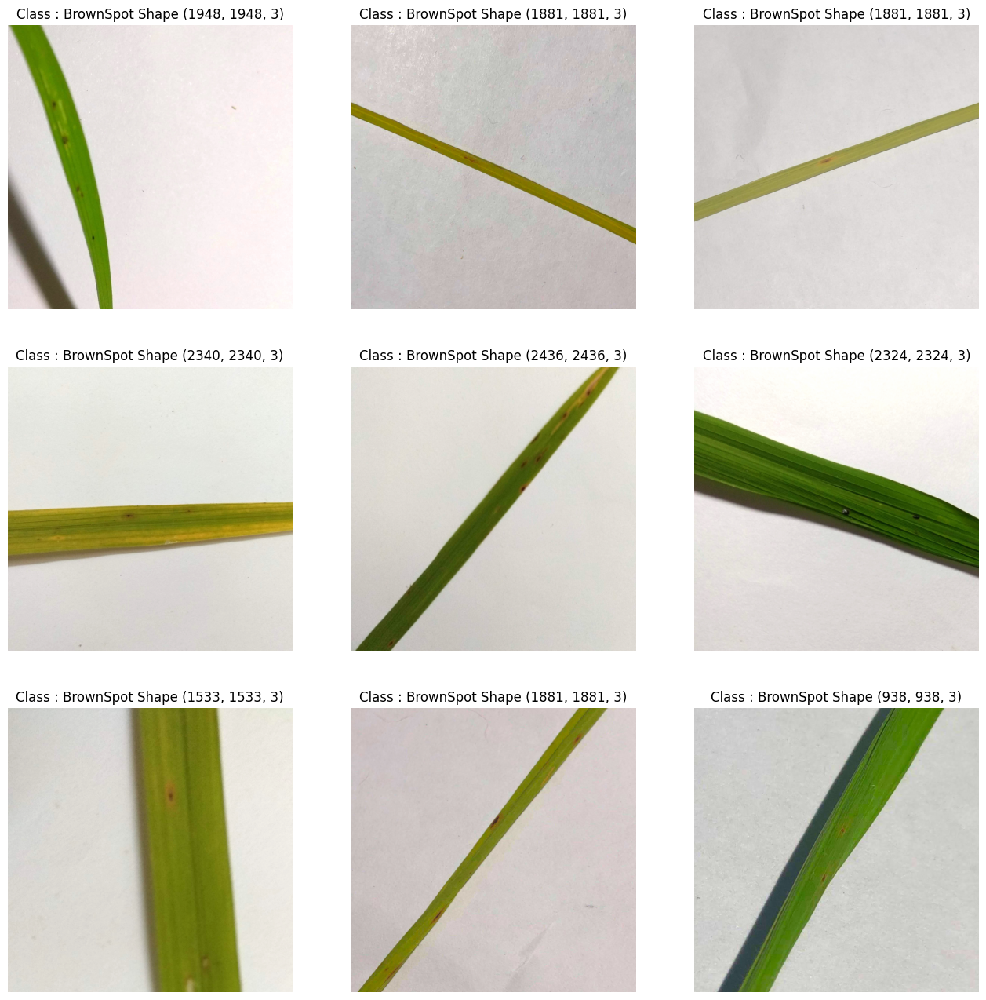

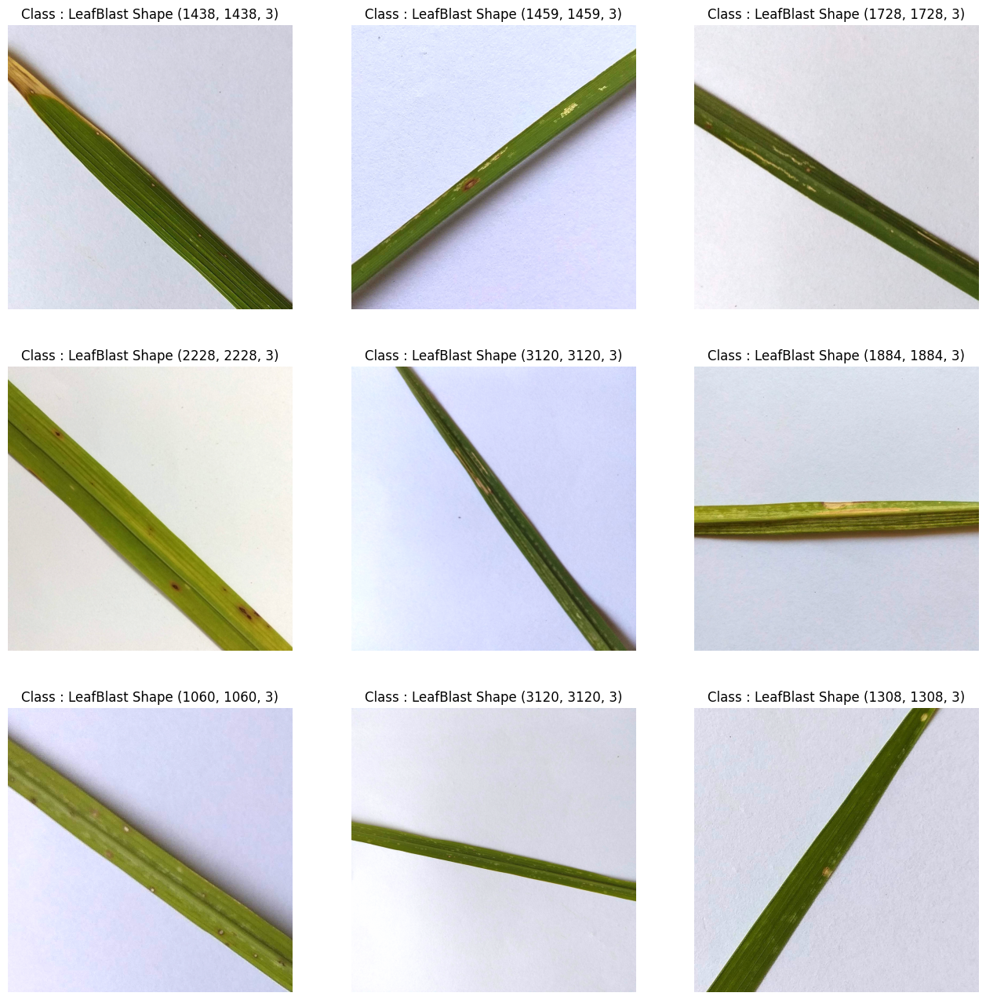

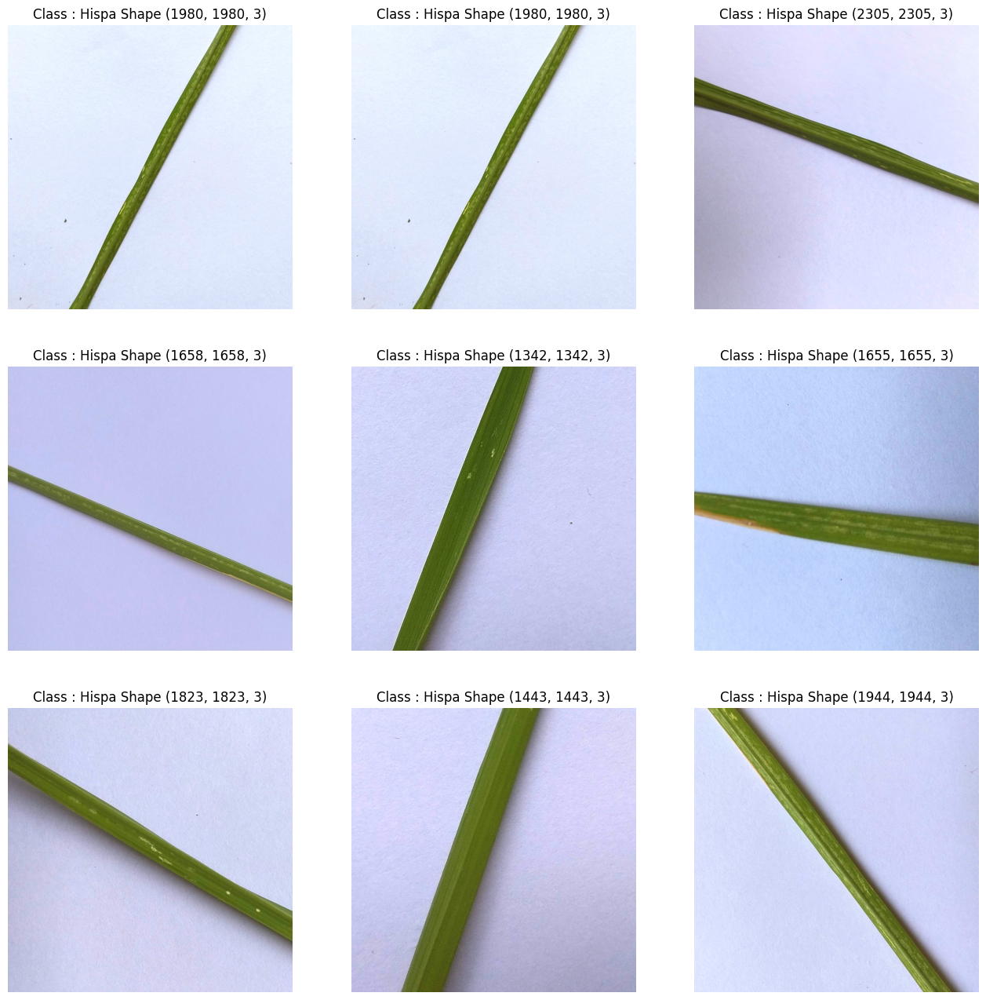

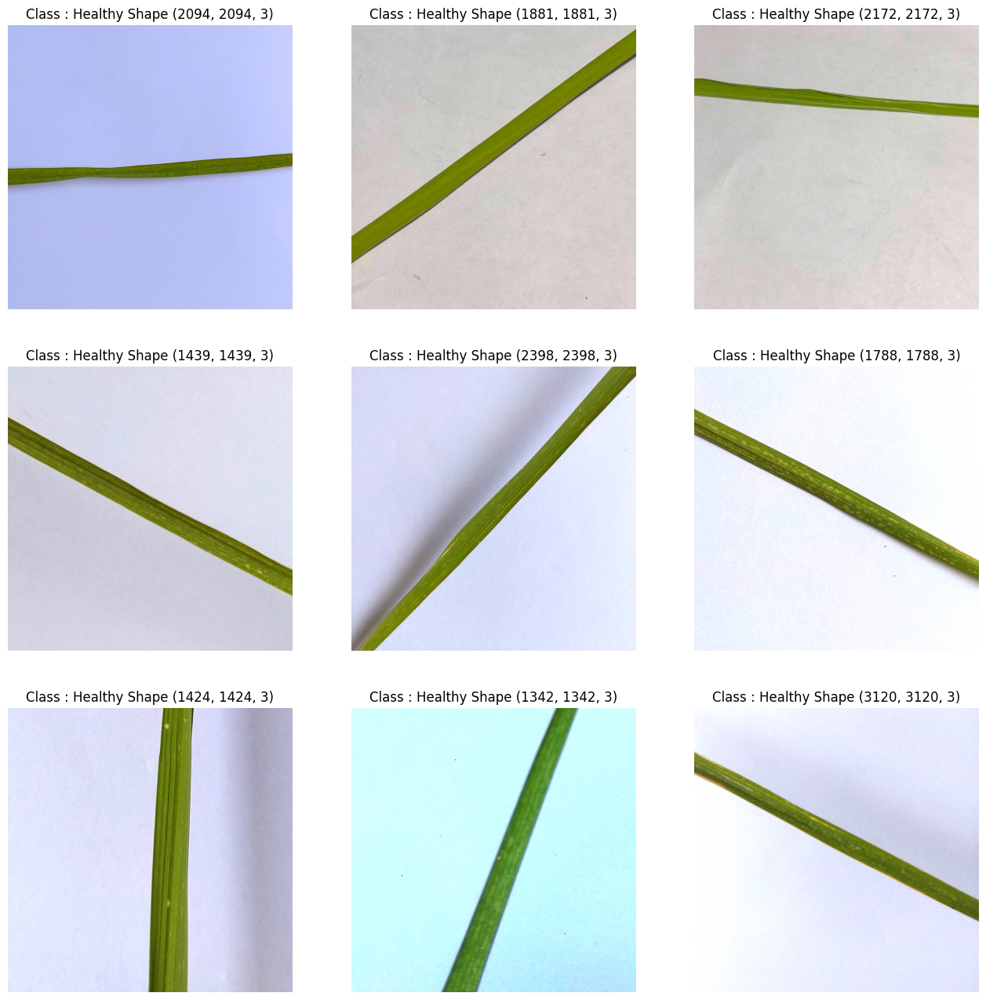

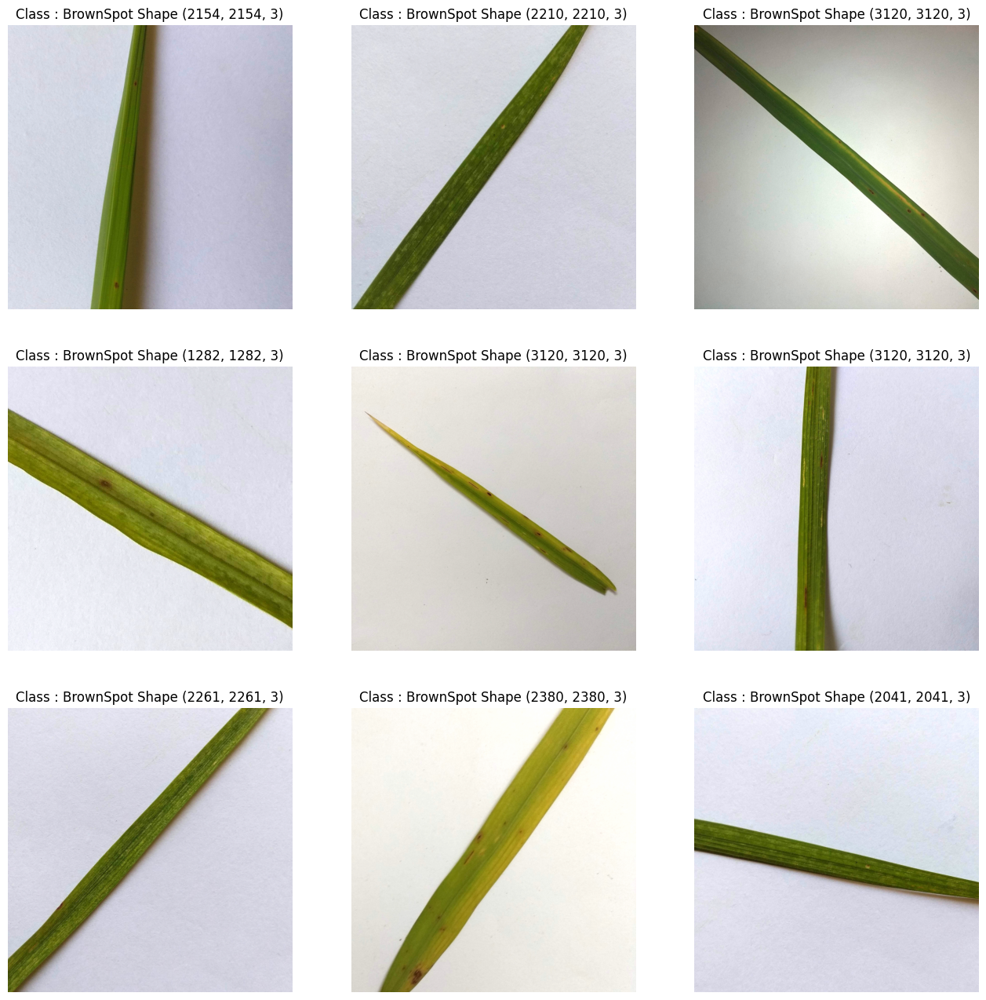

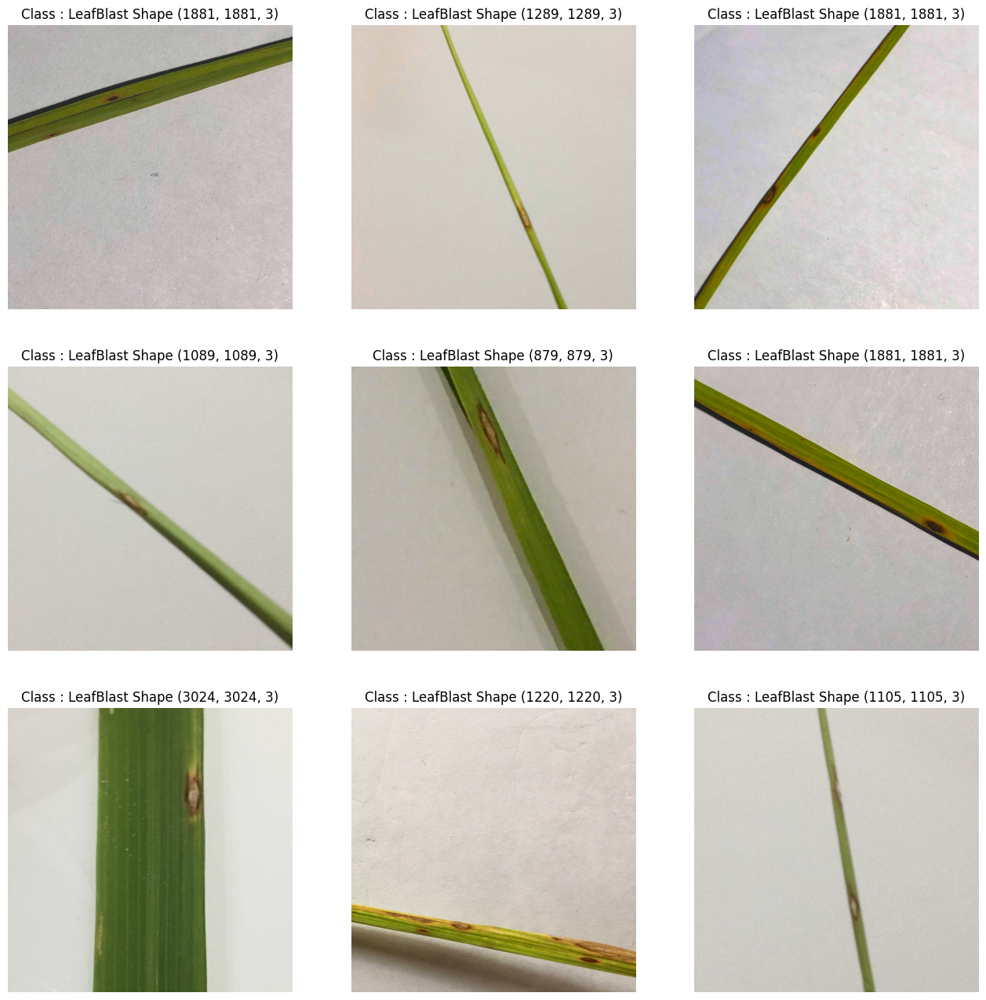

In [58]:
for dir in glob(mainDir+'/*'):
  classes=os.listdir(trainDir)
  for _class in classes:
    printImages(dir=dir, _class=_class)

In [70]:
rescale = 1./255
TARGET_SIZE = [150, 150]
INPUT_SHAPE = TARGET_SIZE + [3]
OUTPUT_CLASSES=4
batch_size = 64
class_mode = "categorical"


train_datagen = ImageDataGenerator(
    rescale=rescale,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)


train_generator = train_datagen.flow_from_directory(
    trainDir,
    target_size=TARGET_SIZE,
    class_mode=class_mode,
    batch_size=batch_size,
    shuffle=True)

test_datagen = ImageDataGenerator(rescale=rescale)

test_generator = test_datagen.flow_from_directory(
    validationDir,
    target_size=TARGET_SIZE,
    class_mode=class_mode,
    batch_size= batch_size,
    shuffle = False)

Found 2684 images belonging to 4 classes.
Found 671 images belonging to 4 classes.


In [71]:
TRAINING_STEPS = train_generator.n // train_generator.batch_size
VALIDATION_STEPS = test_generator.n // test_generator.batch_size


print(f"Training epoch has {TRAINING_STEPS} steps.")
print(f"Validation epoch has {VALIDATION_STEPS} steps.")

Training epoch has 41 steps.
Validation epoch has 10 steps.


In [63]:
train_generator.class_indices

outDictionary = {label : _class for _class, label in train_generator.class_indices.items()}

print(f"Output dictionary : {outDictionary} ")

Output dictionary : {0: 'BrownSpot', 1: 'Healthy', 2: 'Hispa', 3: 'LeafBlast'} 


In [66]:
earlyStopping = EarlyStopping(monitor='val_loss',
                              patience=2,
                              verbose=1)

reduceLr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.1,
                              patience=2,
                              min_lr=0.000001,
                              model='auto')

modelCheck = ModelCheckpoint("model_weights.h5",
                             monitor="val_accuracy",
                             save_weights_only=True,
                             mode="max",
                             verbose=1)


callBacks = [earlyStopping, reduceLr, modelCheck, PlotLossesKerasTF()]


In [73]:
def get_conv_model():
    model = Sequential()
    model.add(Conv2D(16, (3, 3), activation='relu', padding="same", input_shape= INPUT_SHAPE))
    model.add(Conv2D(16, (3, 3), padding="same", activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(32, (3, 3), activation='relu', padding="same"))
    model.add(Conv2D(32, (3, 3), padding="same", activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(64, (3, 3), activation='relu', padding="same"))
    model.add(Conv2D(64, (3, 3), padding="same", activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(96, (3, 3), dilation_rate=(2, 2), activation='relu', padding="same"))
    model.add(Conv2D(96, (3, 3), padding="valid", activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(128, (3, 3), dilation_rate=(2, 2), activation='relu', padding="same"))
    model.add(Conv2D(128, (3, 3), padding="valid", activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())

    model.add(Dense(units=64, activation='relu'))
    model.add(Dropout(0.4))
    model.add(Dense(units= OUTPUT_CLASSES , activation='softmax'))


    print(model.summary())

    return model

In [74]:
model = get_conv_model()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 150, 150, 16)      448       
                                                                 
 conv2d_11 (Conv2D)          (None, 150, 150, 16)      2320      
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 75, 75, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_12 (Conv2D)          (None, 75, 75, 32)        4640      
                                                                 
 conv2d_13 (Conv2D)          (None, 75, 75, 32)        9248      
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 37, 37, 32)        0         
 g2D)                                                 

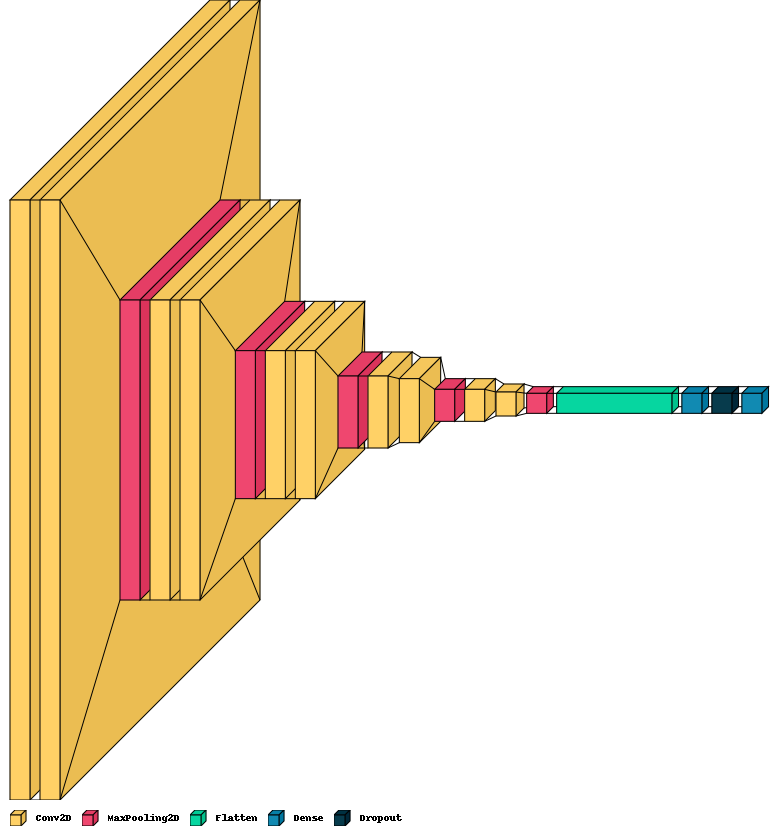

In [75]:
visualkeras.layered_view(model, legend=True)

In [76]:
model.compile(optimizer= 'adam', loss= 'categorical_crossentropy', metrics=['accuracy'])

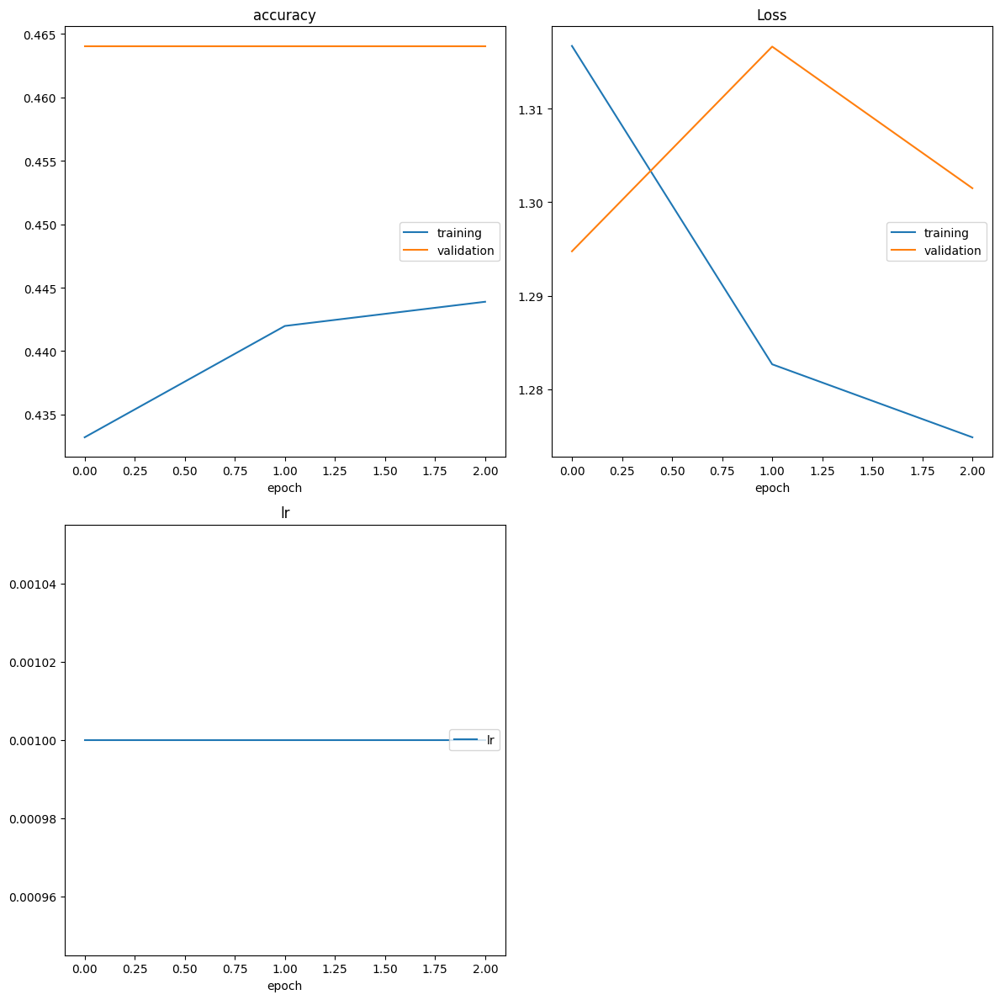

accuracy
	training         	 (min:    0.433, max:    0.444, cur:    0.444)
	validation       	 (min:    0.464, max:    0.464, cur:    0.464)
Loss
	training         	 (min:    1.275, max:    1.317, cur:    1.275)
	validation       	 (min:    1.295, max:    1.317, cur:    1.301)
lr
	lr               	 (min:    0.001, max:    0.001, cur:    0.001)
41/41 [==============================] - 241s 6s/step - loss: 1.2749 - accuracy: 0.4439 - val_loss: 1.3015 - val_accuracy: 0.4641 - lr: 0.0010
Epoch 3: early stopping


In [77]:
modelHistory = model.fit_generator(
    train_generator,
    steps_per_epoch = TRAINING_STEPS,
    epochs=100,
    verbose=1,
    callbacks=callBacks,
    validation_data=test_generator,
    validation_steps=VALIDATION_STEPS)